In [1]:
import pandas as pd
import scanpy as sc
import numpy as np
import scipy
import sklearn
import matplotlib.pyplot as plt
import matplotlib
import sys
import loompy
import scipy.optimize
import os
import seaborn
import bbknn
import re
import importlib
spec = importlib.util.spec_from_file_location("ScanpyUtilsMT", os.path.expanduser("../../utils/ScanpyUtilsMT.py"))
sc_utils = importlib.util.module_from_spec(spec)
spec.loader.exec_module(sc_utils)


In [2]:
%%time
filepath=os.path.expanduser(os.path.join('/wynton/scratch/mtschmitz/fastqpool'))
fileList=os.listdir(filepath)
fileList=[x for x in fileList if 'kout' in x.lower()]
print(fileList)
fileList=[x for x in fileList if ('encephal' in x.lower()) or ('encephal' in x.lower())]
#fileList+=['GW20CGE_kOut']
fileList
fileList=fileList+['E65-2019A_Hypothalamus_kOut', 'E80-2019_Parietal_kOut']
print(fileList)


['E100cingulate_kOut', 'E100insula_kOut', 'E100parietal_kOut', 'E40_Hindbrain_kOut', 'E50_parietal_kOut', 'E40_parietal_kOut', 'E40_PFC_kOut', 'E50_V1_kOut', 'E40_Pre-optic_kOut', 'E40_MGE_kOut', 'E50_PFC_kOut', 'E40_Midbrain_kOut', 'E80MGE_kOut', 'E40_motor_kOut', 'E80PFC_kOut', 'E100PFC_kOut', 'E40_Choroid_kOut', 'E50_motor_kOut', 'E40_somato_kOut', 'E100somato_kOut', 'E40_hippocampus_kOut', 'E50_septum_kOut', 'E100temporal_kOut', 'E40_Hypo_kOut', 'E50_somato_kOut', 'E40_thalamus_kOut', 'E40_V1_kOut', 'E80V1_kOut', 'E50_temporal_kOut', 'E50_cerebellum_kOut', 'E50_CGE-LGE_kOut', 'E100V1_kOut', 'E40_DRG_kOut', 'E50_choroid_kOut', 'E50_hindbrain_kOut', 'E50_hippo-temp_kOut', 'E100hippo_kOut', 'E100motor_kOut', 'E40_CGE-LGE_kOut', 'E50_hypo_kOut', 'E50_MGE_kOut', 'Mix10_kOut', 'E65-2019A_Cerebellum_Pons_kOut', 'E65-2019A_CGE_AND_LGE_kOut', 'E65-2019A_Hippocampus_choroid_kOut', 'E65-2019A_V1_kOut', 'E65-2019A_Hypothalamus_kOut', 'E65-2019A_MGE_kOut', 'E65-2019A_Midbrain_kOut', 'E65-2019A_

In [3]:
adatas=[]
filename='aem_cellbended_150_750_175e_V0.2'
for f in fileList:
    print(f,flush=True)
    #try:
    if os.path.exists(os.path.join(filepath,f,filename,'aem_cellbended_filtered.h5')):
        sadata = sc_utils.readCellbenderH5(os.path.join(filepath,f,filename,'aem_cellbended_filtered.h5'))
        sadata =sadata[sadata.obs['latent_cell_probability']>.99,:]
        sc.pp.filter_cells(sadata,min_genes=500)
    else:
        #continue
        print(os.path.join(filepath,f,'all_em'),flush=True)
        sadata=sc_utils.loadPlainKallisto(os.path.join(filepath,f,'all_em'),min_genes=500)
    print(1,flush=True)
    sadata.obs.index=[re.sub("-1","",x) for x in sadata.obs.index]
    sadata.uns['name']=f
    sadata.obs['batch_name']=str(sadata.uns['name'])
    print(2,flush=True)
    print(2.01,flush=True)
    sadata.obs['timepoint']=sc_utils.tp_format_human(sadata.uns['name'])
    print(2.1,flush=True)
    regionstring=sc_utils.region_format_human(sadata.uns['name'])
    print(2.2,flush=True)
    regionstring=regionstring.lower()
    print(3,flush=True)
    sadata.obs['region']=regionstring
    adatas.append(sadata)
    #except:
    #    continue

#hdatas=hdatas+[multi]
hdata=sc.concat(adatas)

E80-2022_Mesencephalon_1_kOut


/wynton/home/ye/mschmitz1/utils/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
/wynton/home/ye/mschmitz1/utils/miniconda3/envs/scanpy/lib/python3.9/site-packages/scipy/sparse/_index.py:124: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)
Trying to set attribute `.obs` of view, copying.


1
2
2.01
2.1
2.2
3
E80-2022_Mesencephalon_2_kOut


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.


1
2
2.01
2.1
2.2
3
E80-2022_Metencephalon_2_kOut


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.


1
2
2.01
2.1
2.2
3
E80-2022_Metencephalon_1_kOut


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.


1
2
2.01
2.1
2.2
3
E80-2022_Diencephalon_2_kOut


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.


1
2
2.01
2.1
2.2
3
E80-2022_Myelencephalon_2_kOut


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.


1
2
2.01
2.1
2.2
3
E80-2022_Diencephalon_1_kOut


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.


1
2
2.01
2.1
2.2
3
E80-2022_Myelencephalon_1_kOut


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.


1
2
2.01
2.1
2.2
3
E65-2019A_Hypothalamus_kOut


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.


1
2
2.01
2.1
2.2
3
E80-2019_Parietal_kOut


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.


1
2
2.01
2.1
2.2
3


Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [4]:
adatas

[AnnData object with n_obs × n_vars = 5838 × 66351
     obs: 'latent_cell_probability', 'latent_RT_efficiency', 'n_genes', 'batch_name', 'timepoint', 'region'
     var: 'feature_type-0', 'id-0', 'name-0', 'feature_type-1', 'id-1', 'name-1'
     uns: 'name'
     layers: 'unspliced', 'spliced', 'ambiguous',
 AnnData object with n_obs × n_vars = 8913 × 66351
     obs: 'latent_cell_probability', 'latent_RT_efficiency', 'n_genes', 'batch_name', 'timepoint', 'region'
     var: 'feature_type-0', 'id-0', 'name-0', 'feature_type-1', 'id-1', 'name-1'
     uns: 'name'
     layers: 'unspliced', 'spliced', 'ambiguous',
 AnnData object with n_obs × n_vars = 10157 × 66351
     obs: 'latent_cell_probability', 'latent_RT_efficiency', 'n_genes', 'batch_name', 'timepoint', 'region'
     var: 'feature_type-0', 'id-0', 'name-0', 'feature_type-1', 'id-1', 'name-1'
     uns: 'name'
     layers: 'unspliced', 'spliced', 'ambiguous',
 AnnData object with n_obs × n_vars = 9887 × 66351
     obs: 'latent_cell_prob

In [5]:
sc.pp.filter_genes(hdata,min_cells=2)
sc.pp.filter_cells(hdata,min_genes=2)
sc.pp.filter_genes(hdata,min_cells=2)

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [6]:
hdata.obs['batch_name'].value_counts()

E80-2022_Metencephalon_2_kOut     10157
E80-2022_Metencephalon_1_kOut      9887
E80-2022_Diencephalon_2_kOut       9536
E80-2022_Mesencephalon_2_kOut      8913
E80-2022_Diencephalon_1_kOut       8789
E80-2022_Myelencephalon_1_kOut     7415
E80-2022_Myelencephalon_2_kOut     6791
E80-2022_Mesencephalon_1_kOut      5838
E65-2019A_Hypothalamus_kOut        5061
E80-2019_Parietal_kOut             3352
Name: batch_name, dtype: int64

In [7]:
hdata.obs['n_counts']=hdata.X.sum(1)

/wynton/home/ye/mschmitz1/utils/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'batch_name' as categorical
/wynton/home/ye/mschmitz1/utils/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'timepoint' as categorical
/wynton/home/ye/mschmitz1/utils/miniconda3/envs/scanpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Ca

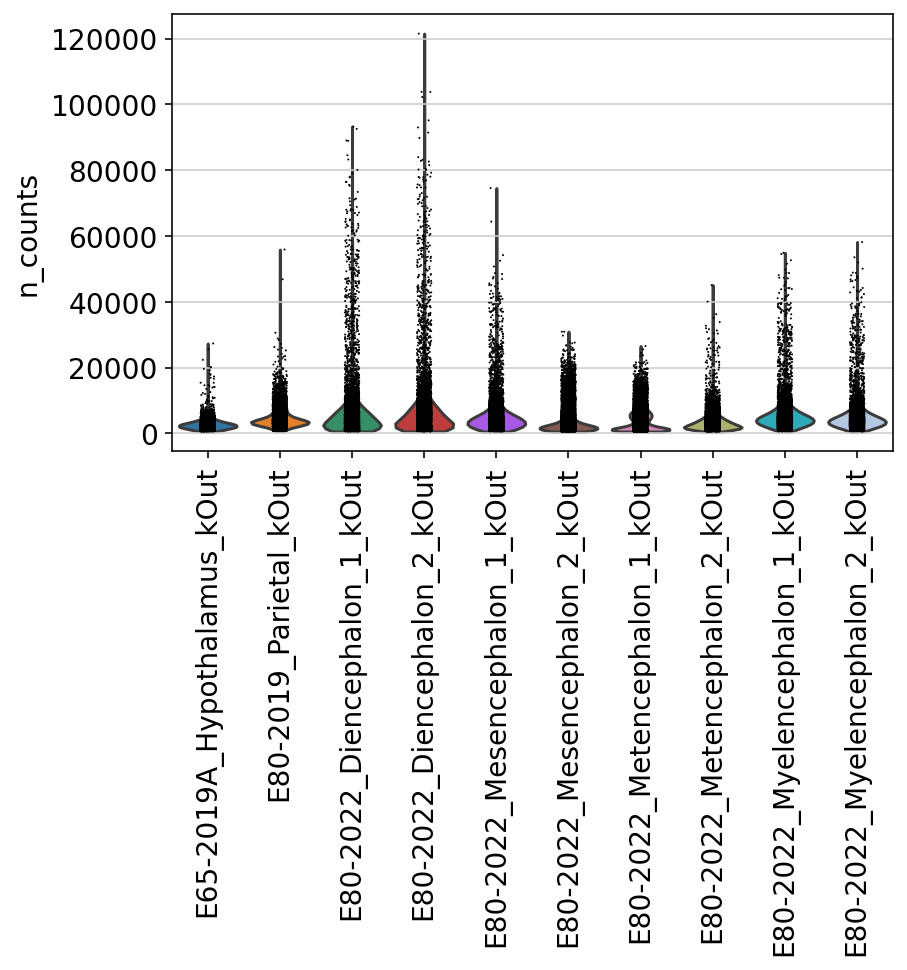

In [8]:
%matplotlib inline
sc.pl.violin(hdata,groupby='batch_name',keys='n_counts',rotation=90)

In [9]:
D1,D2,Mes2,Met1,Met2

NameError: name 'D1' is not defined

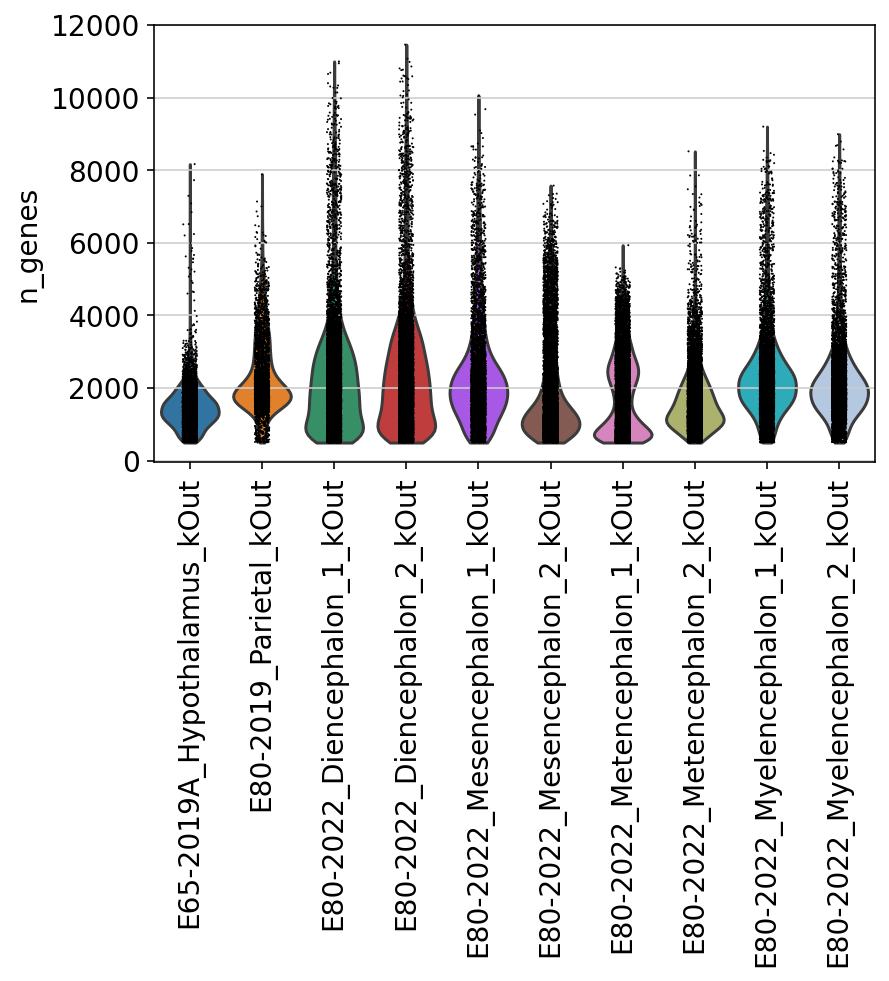

In [10]:
%matplotlib inline
sc.pl.violin(hdata,groupby='batch_name',keys='n_genes',rotation=90)

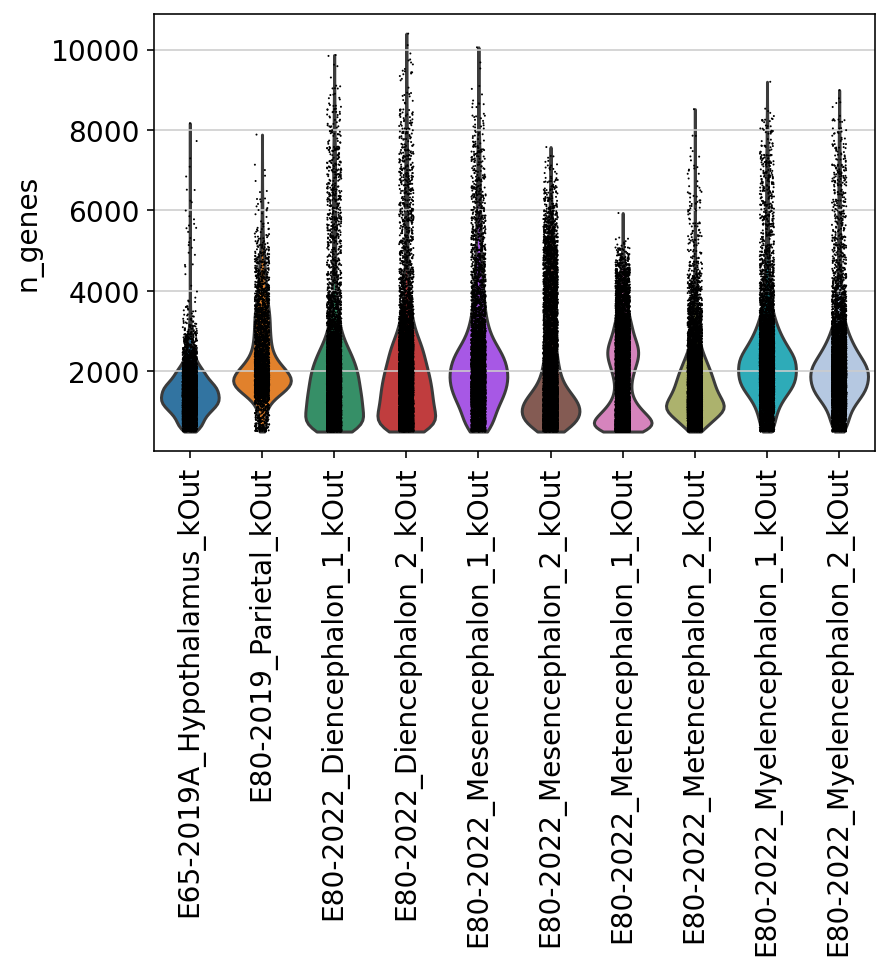

In [15]:
%matplotlib inline
#Old
sc.pl.violin(hdata,groupby='batch_name',keys='n_genes',rotation=90)

In [11]:
sc.pp.normalize_per_cell(hdata)
sc.pp.log1p(hdata)
sc.pp.highly_variable_genes(hdata,n_top_genes=8000)
sc.pp.scale(hdata,max_value=10)

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


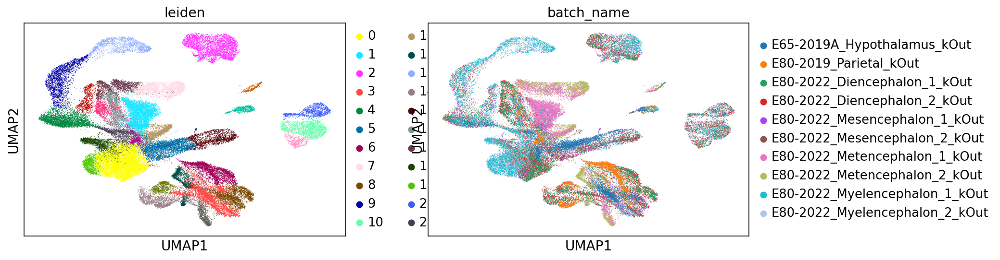

In [12]:
%matplotlib inline
sc.pp.pca(hdata,n_comps=50)
#sc.pp.neighbors(bendedadata)
bbknn.bbknn(hdata,batch_key='batch_name')
sc.tl.leiden(hdata)
sc.tl.umap(hdata)
sc.pl.umap(hdata,color=['leiden','batch_name'])

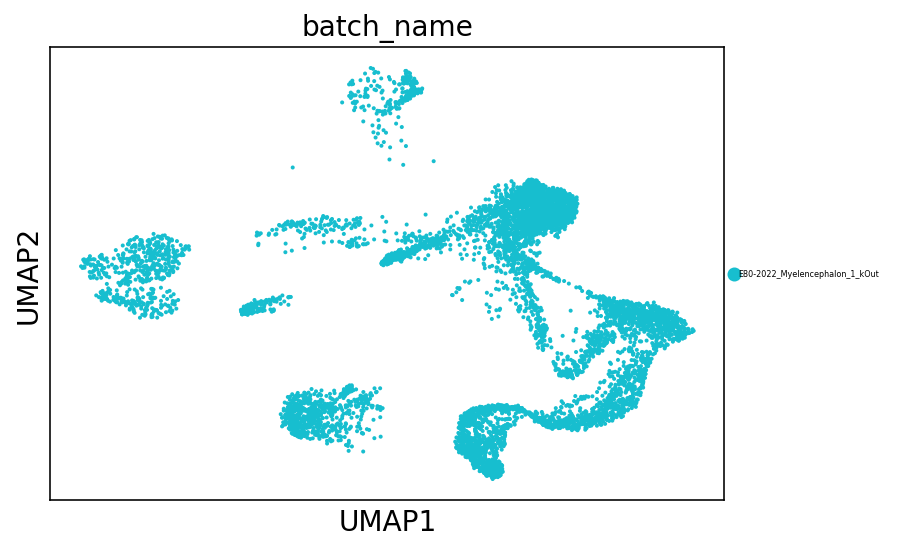

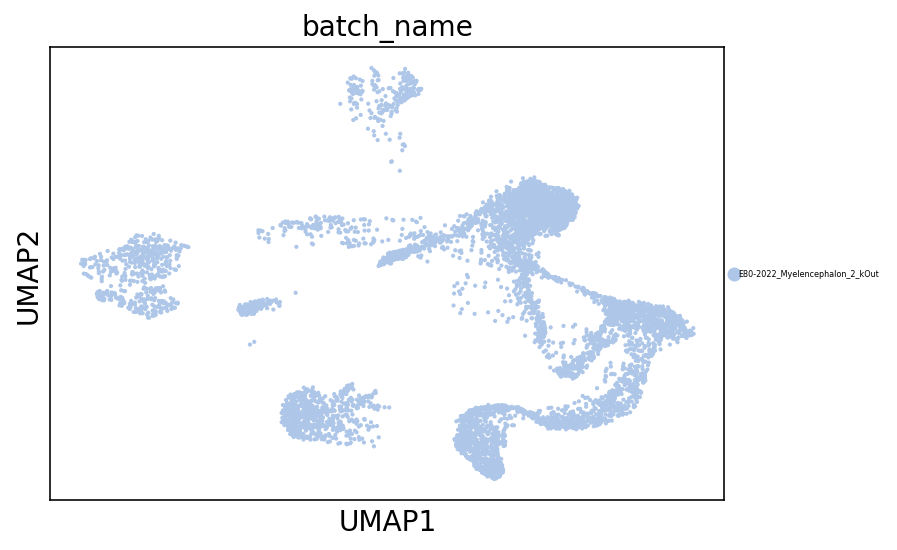

In [19]:
sc.pl.umap(hdata[hdata.obs['batch_name'].str.contains('Myelencephalon_1'),:],color=['batch_name'],legend_fontsize=4)
sc.pl.umap(hdata[hdata.obs['batch_name'].str.contains('Myelencephalon_2'),:],color=['batch_name'],legend_fontsize=4)

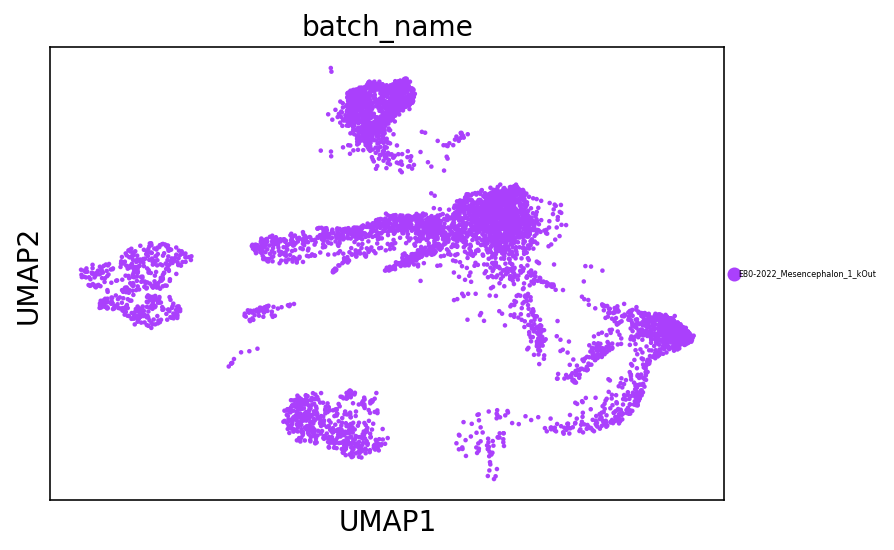

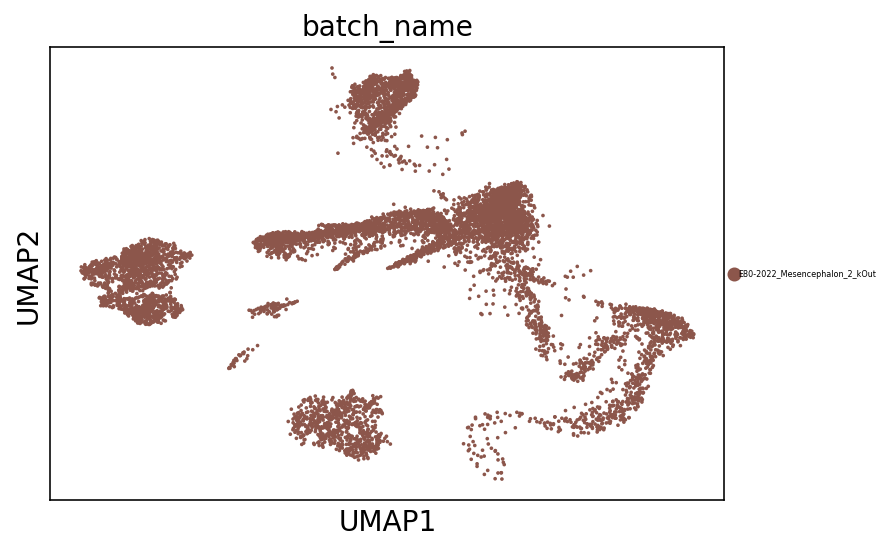

In [22]:
sc.pl.umap(hdata[hdata.obs['batch_name'].str.contains('Mesencephalon_1'),:],color=['batch_name'],legend_fontsize=4)
sc.pl.umap(hdata[hdata.obs['batch_name'].str.contains('Mesencephalon_2'),:],color=['batch_name'],legend_fontsize=4)

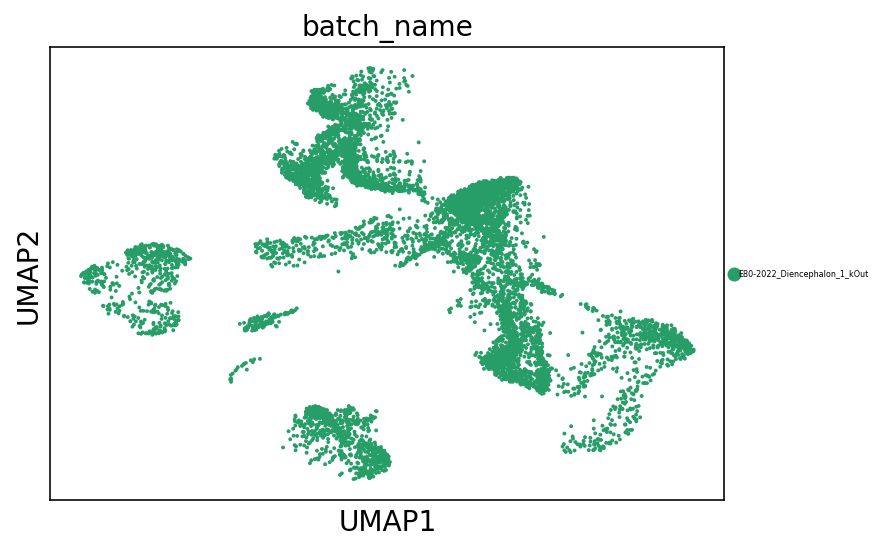

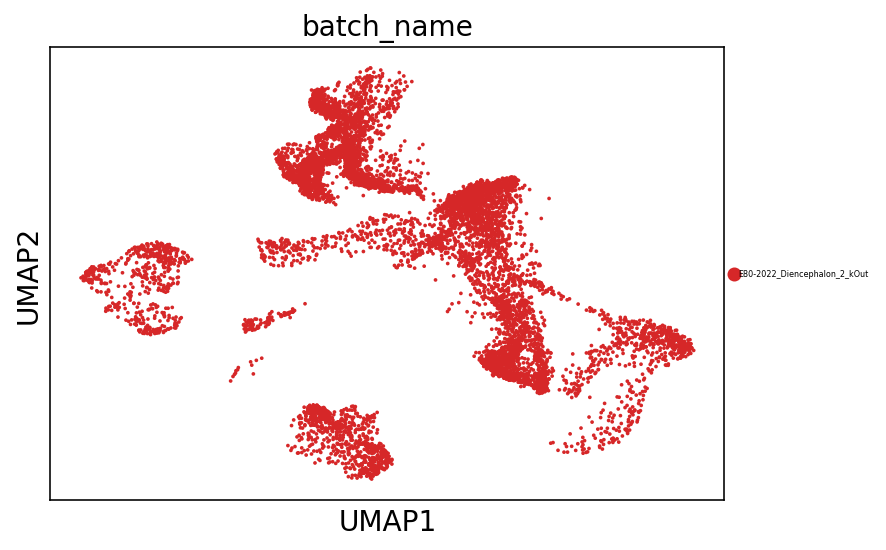

In [23]:
sc.pl.umap(hdata[hdata.obs['batch_name'].str.contains('Diencephalon_1'),:],color=['batch_name'],legend_fontsize=4)
sc.pl.umap(hdata[hdata.obs['batch_name'].str.contains('Diencephalon_2'),:],color=['batch_name'],legend_fontsize=4)

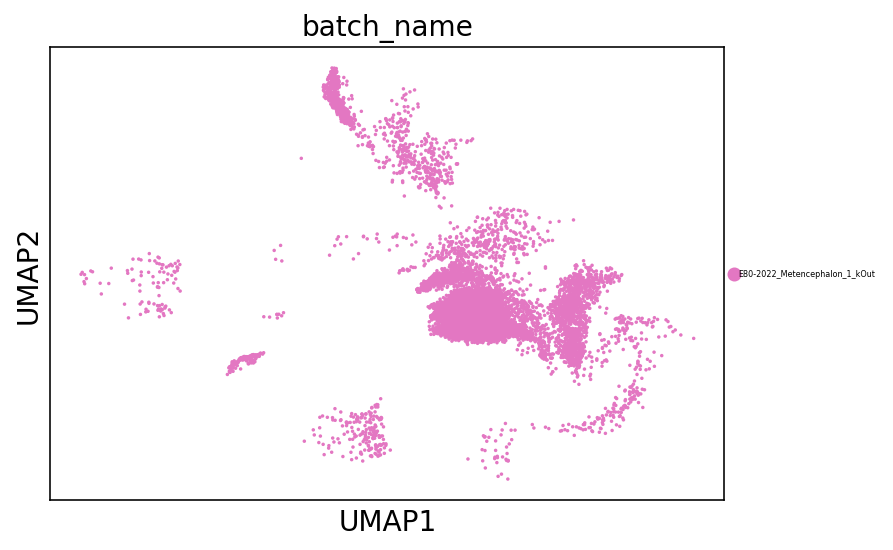

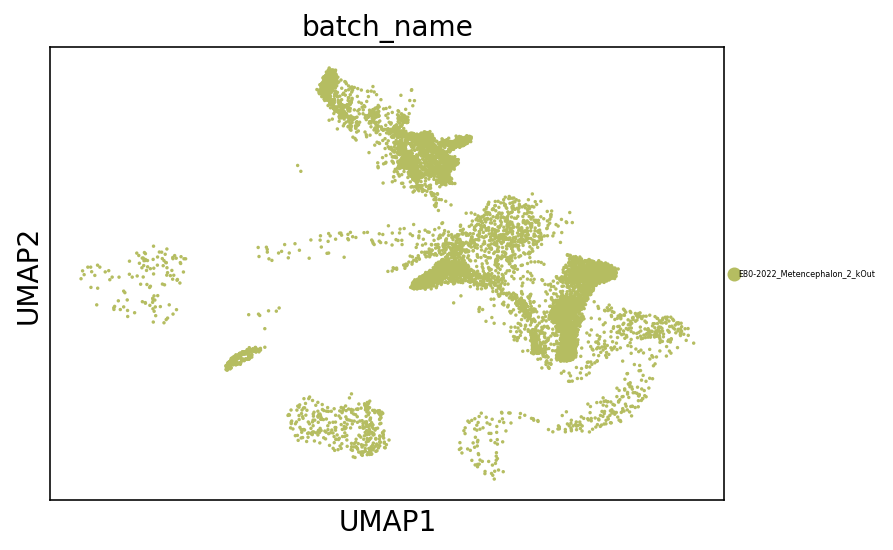

In [25]:
sc.pl.umap(hdata[hdata.obs['batch_name'].str.contains('Metencephalon_1'),:],color=['batch_name'],legend_fontsize=4)
sc.pl.umap(hdata[hdata.obs['batch_name'].str.contains('Metencephalon_2'),:],color=['batch_name'],legend_fontsize=4)

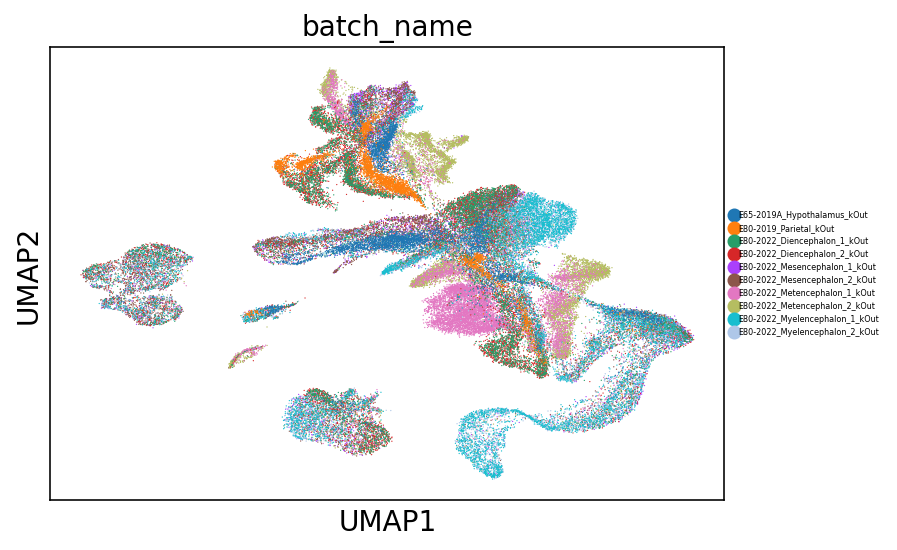

In [21]:
sc.pl.umap(hdata,color=['batch_name'],legend_fontsize=4)

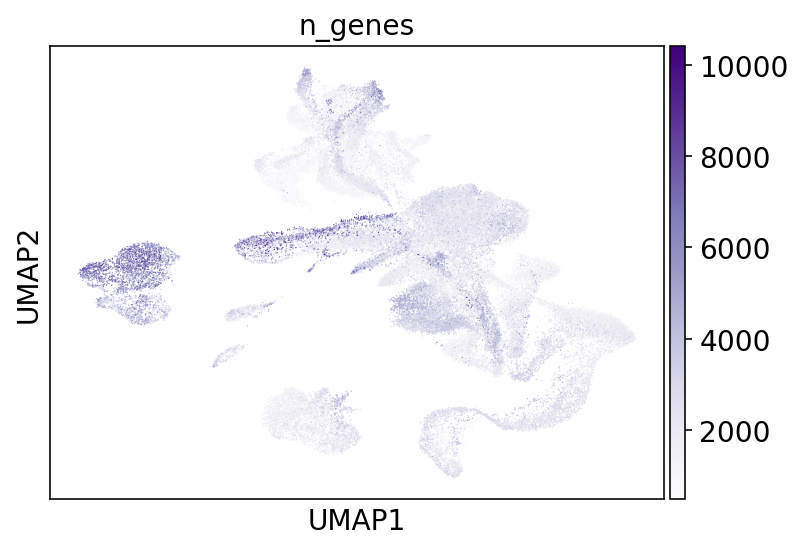

In [20]:
sc.pl.umap(hdata,color=['n_genes'],legend_fontsize=4)

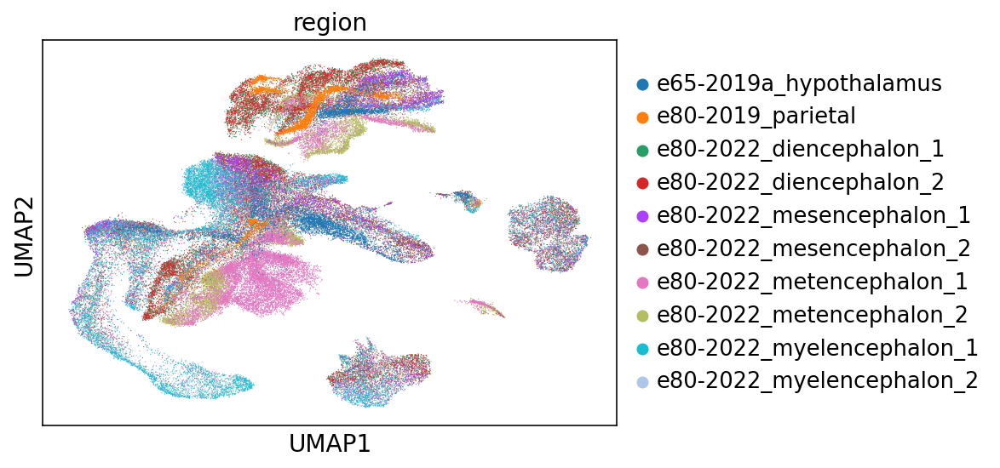

In [15]:
%matplotlib inline
sc.pl.umap(hdata,color=['region'])

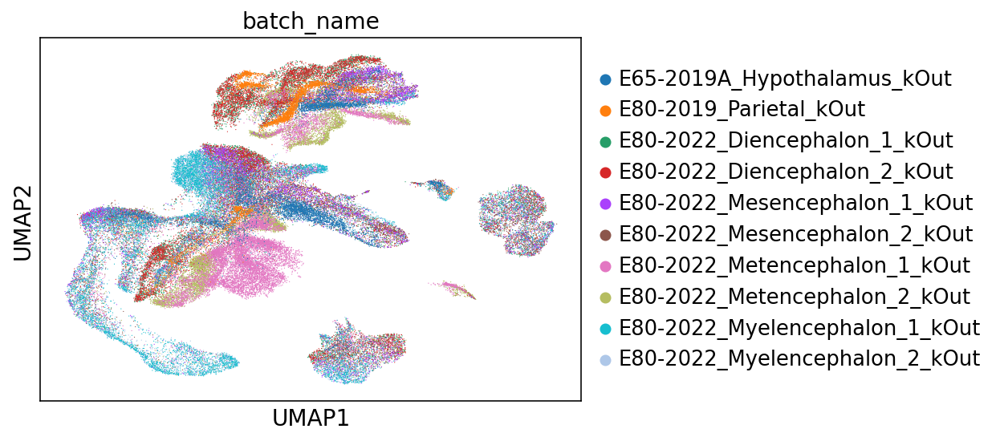

In [16]:
sc.pl.umap(hdata,color=['batch_name'])

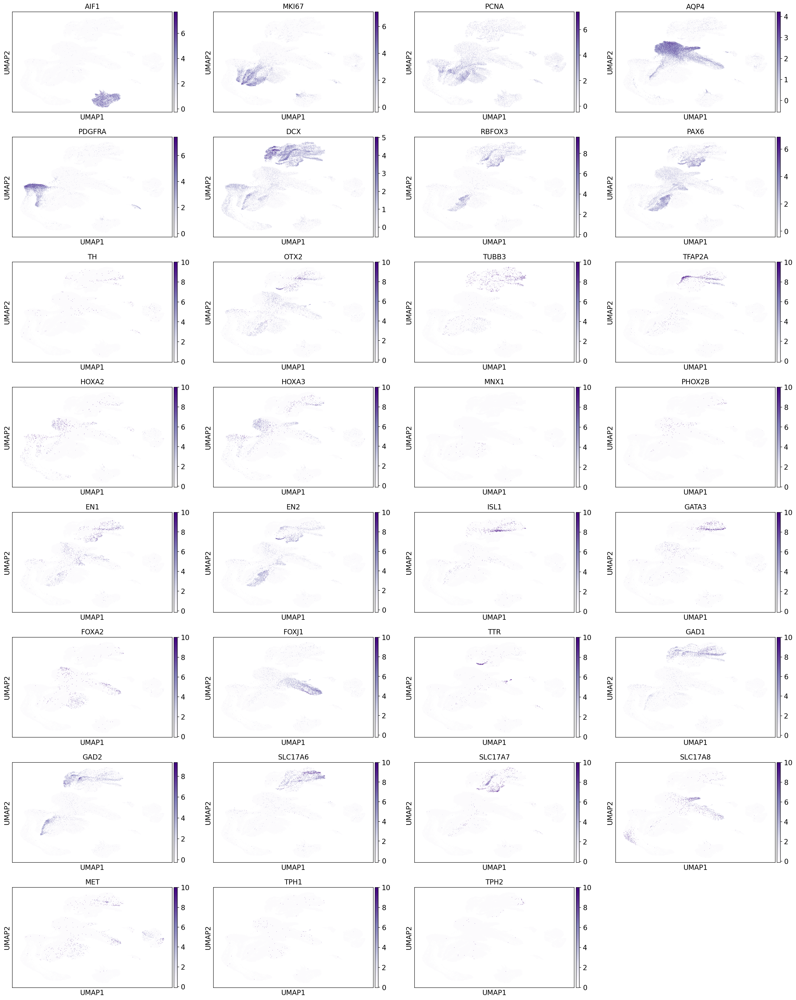

In [17]:
easygenes= ['AIF1','MKI67','PCNA','AQP4','PDGFRA','DCX','RBFOX3','PAX6','TH','OTX2','TUBB3','TFAP2A','HOXA2','HOXA3','MNX1','PHOX2B','EN1','EN2','ISL1','GATA3','FOXA2','FOXJ1','TTR','GAD1','GAD2','SLC17A6','SLC17A7','SLC17A8','MET','TPH1','TPH2']
easygenes=[x for x in easygenes if x in hdata.var.index]
sc.pl.umap(hdata,color=easygenes,use_raw=False)

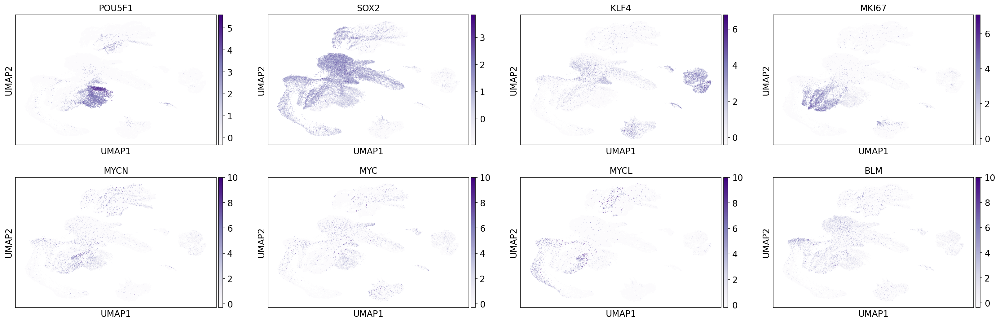

In [18]:
easygenes= ['NANOG','POU5F1','SOX2','KLF4','MKI67','MYCN','MYC','MYCL','BLM']
easygenes=[x for x in easygenes if x in hdata.var.index]
sc.pl.umap(hdata,color=easygenes,use_raw=False)

In [23]:
hdata.obs['batch_name'].value_counts()

E80-2022_Metencephalon_1_kOut     12508
E80-2022_Metencephalon_2_kOut     10620
E80-2022_Diencephalon_2_kOut       9909
E80-2022_Mesencephalon_2_kOut      9793
E80-2022_Diencephalon_1_kOut       9113
E80-2022_Myelencephalon_1_kOut     7556
E80-2022_Myelencephalon_2_kOut     6964
E80-2022_Mesencephalon_1_kOut      6097
E65-2019A_Hypothalamus_kOut        5519
E80-2019_Parietal_kOut             3389
Name: batch_name, dtype: int64

In [13]:
destroy_cells=hdata[hdata.obs['leiden']=='1',:].obs.index

In [14]:
hdata[hdata.obs['batch_name'].str.contains('Metencephalon_1'),:]

View of AnnData object with n_obs × n_vars = 9887 × 44050
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'n_genes', 'batch_name', 'timepoint', 'region', 'n_counts', 'leiden'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_name_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'unspliced', 'spliced', 'ambiguous'
    obsp: 'distances', 'connectivities'

In [15]:
#hdata=sc.concat(adatas)

In [16]:
adatas[6]

AnnData object with n_obs × n_vars = 8789 × 66351
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'n_genes', 'batch_name', 'timepoint', 'region'
    var: 'feature_type-0', 'id-0', 'name-0', 'feature_type-1', 'id-1', 'name-1'
    uns: 'name'
    layers: 'unspliced', 'spliced', 'ambiguous'

In [29]:
barcodes=pd.read_csv('/wynton/scratch/mtschmitz/fastqpool/E80-2022_Metencephalon_1_kOut/all_em/barcodes.tsv.gz',header=None)

In [22]:
barcodes.loc[barcodes[0].isin(destroy_cells),0]=barcodes.loc[barcodes[0].isin(destroy_cells),0]+"_HUMAN"

In [19]:
barcodes.to_csv('/wynton/scratch/mtschmitz/fastqpool/E80-2022_Metencephalon_1_kOut/all_em/human_barcodes.tsv',index=False,header=None)

In [20]:
pd.DataFrame(destroy_cells).to_csv('/wynton/scratch/mtschmitz/fastqpool/E80-2022_Metencephalon_1_kOut/all_em/human_cells.csv',index=False,header=None)

In [28]:
barcodes.loc[barcodes[0].isin(destroy_cells),:]

,0


/wynton/home/ye/mschmitz1/utils/miniconda3/envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/wynton/home/ye/mschmitz1/utils/miniconda3/envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/wynton/home/ye/mschmitz1/utils/miniconda3/envs/scanpy/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at onc

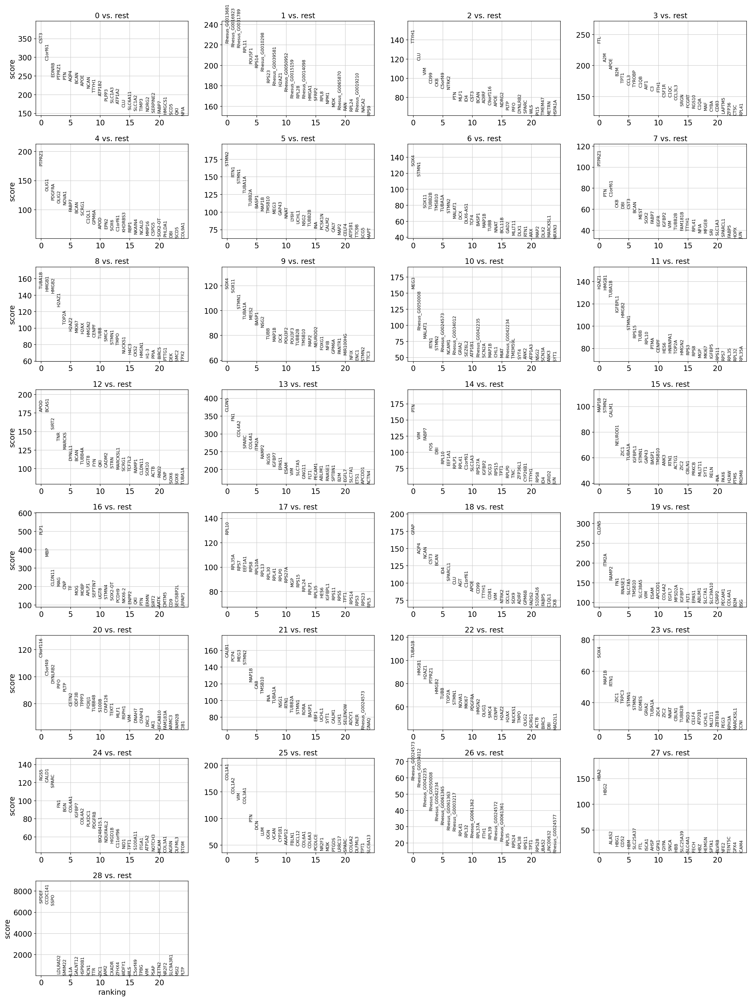

In [18]:
sc.tl.rank_genes_groups(hdata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(hdata, n_genes=25, sharey=False)